<a href="https://colab.research.google.com/github/Bhumika1304/Assignment-1/blob/main/ML_MINI_PROJECT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install cartopy basemap requests beautifulsoup4 geopy


In [ ]:
!pip install cartopy requests beautifulsoup4 geopy

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
import datetime
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster

In [ ]:
def scrape_earthquake_data():
    url = 'https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv'
    response = requests.get(url)
    if response.status_code == 200:
        data = pd.read_csv(url)
        return data
    else:
        print(f"Failed to retrieve data. Status code: {response.status_code}")
        return None

# Scrape earthquake data
earthquake_data = scrape_earthquake_data()

# Display the first few rows of the dataset
if earthquake_data is not None:
    print(earthquake_data.head())
else:
    print("No earthquake data retrieved.")

                       time   latitude   longitude  depth   mag magType   nst  \
0  2025-05-31T05:07:14.930Z  35.322333 -117.802667   6.81  1.13      ml  34.0   
1  2025-05-31T04:57:12.935Z  65.237200 -150.825400   8.10  1.00      ml   NaN   
2  2025-05-31T04:54:45.840Z  33.532333 -116.727833   5.25  0.45      ml  23.0   
3  2025-05-31T04:54:06.320Z  38.814999 -122.793999   1.91  1.09      md  23.0   
4  2025-05-31T04:48:12.559Z  64.498900 -157.600800   6.60  1.50      ml   NaN   

    gap      dmin   rms  ...                   updated  \
0  54.0  0.065170  0.17  ...  2025-05-31T05:10:43.161Z   
1   NaN       NaN  0.39  ...  2025-05-31T04:59:15.771Z   
2  41.0  0.033910  0.12  ...  2025-05-31T04:58:13.150Z   
3  40.0  0.007094  0.02  ...  2025-05-31T04:55:42.441Z   
4   NaN       NaN  0.64  ...  2025-05-31T04:51:44.834Z   

                                     place        type horizontalError  \
0            16 km WSW of Johannesburg, CA  earthquake            0.16   
1  27 km NNW of 

In [ ]:
def preprocess_data(df):
    # Select relevant columns and rename them for consistency
    df = df[['time', 'latitude', 'longitude', 'depth', 'mag', 'place']].copy()
    df.columns = ['Time', 'Latitude', 'Longitude', 'Depth', 'Magnitude', 'Location']

    # Convert time to datetime
    df['Time'] = pd.to_datetime(df['Time'])

    # Extract additional features from the datetime column
    df['Year'] = df['Time'].dt.year
    df['Month'] = df['Time'].dt.month
    df['Day'] = df['Time'].dt.day
    df['Hour'] = df['Time'].dt.hour
    df['Minute'] = df['Time'].dt.minute
    df['Second'] = df['Time'].dt.second

    # Handle missing values if any
    df = df.dropna()

    return df

# Preprocess the data
processed_data = preprocess_data(earthquake_data)
print(processed_data.head())

                              Time   Latitude   Longitude  Depth  Magnitude  \
0 2025-05-31 05:07:14.930000+00:00  35.322333 -117.802667   6.81       1.13   
1 2025-05-31 04:57:12.935000+00:00  65.237200 -150.825400   8.10       1.00   
2 2025-05-31 04:54:45.840000+00:00  33.532333 -116.727833   5.25       0.45   
3 2025-05-31 04:54:06.320000+00:00  38.814999 -122.793999   1.91       1.09   
4 2025-05-31 04:48:12.559000+00:00  64.498900 -157.600800   6.60       1.50   

                                  Location  Year  Month  Day  Hour  Minute  \
0            16 km WSW of Johannesburg, CA  2025      5   31     5       7   
1  27 km NNW of Manley Hot Springs, Alaska  2025      5   31     4      57   
2                     6 km WSW of Anza, CA  2025      5   31     4      54   
3              5 km NNW of The Geysers, CA  2025      5   31     4      54   
4               34 km SE of Nulato, Alaska  2025      5   31     4      48   

   Second  
0      14  
1      12  
2      45  
3       

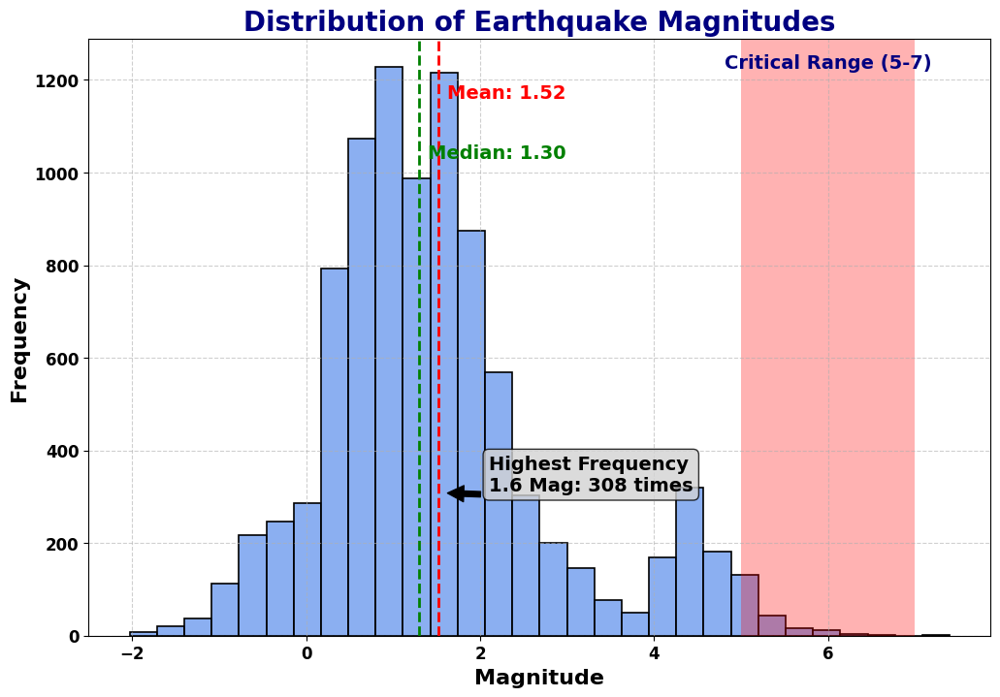

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
def plot_magnitude_distribution(df):
    plt.figure(figsize=(12, 8))
    # Create the histogram with KDE plot using blue hues
    sns.histplot(df['Magnitude'], bins=30, color='cornflowerblue', edgecolor='black', linewidth=1.2)
    # Add a vertical line at the mean magnitude
    mean_magnitude = df['Magnitude'].mean()
    plt.axvline(mean_magnitude, color='red', linestyle='--', linewidth=2)
    plt.text(mean_magnitude + 0.1, plt.ylim()[1] * 0.9, f'Mean: {mean_magnitude:.2f}', color='red', fontsize=14, fontweight='bold')
    # Add a vertical line at the median magnitude
    median_magnitude = df['Magnitude'].median()
    plt.axvline(median_magnitude, color='green', linestyle='--', linewidth=2)
    plt.text(median_magnitude + 0.1, plt.ylim()[1] * 0.8, f'Median: {median_magnitude:.2f}', color='green', fontsize=14, fontweight='bold')
    # Customizing the title and labels
    plt.title('Distribution of Earthquake Magnitudes', fontsize=20, fontweight='bold', color='navy')
    plt.xlabel('Magnitude', fontsize=16, fontweight='bold')
    plt.ylabel('Frequency', fontsize=16, fontweight='bold')
    # Customize the tick parameters
    plt.xticks(fontsize=12, fontweight='bold')
    plt.yticks(fontsize=12, fontweight='bold')
    # Add custom grid
    plt.grid(True, linestyle='--', alpha=0.6)
    # Highlight certain ranges with a shaded area
    plt.axvspan(5, 7, color='red', alpha=0.3, lw=0)
    plt.text(6, plt.ylim()[1] * 0.95, 'Critical Range (5-7)', color='navy', fontsize=14, fontweight='bold', ha='center')
    # Adding annotations for the highest frequency bin
    max_freq_bin = df['Magnitude'].value_counts().idxmax()
    max_freq_count = df['Magnitude'].value_counts().max()
    plt.annotate(f'Highest Frequency\n{max_freq_bin} Mag: {max_freq_count} times',
                 xy=(max_freq_bin, df['Magnitude'].value_counts()[max_freq_bin]),
                 xytext=(max_freq_bin + 0.5, df['Magnitude'].value_counts()[max_freq_bin] + 5),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=14, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="lightgray", alpha=0.8))
    # Show the plot
    plt.show()
# Plot the enhanced magnitude distribution with blue hues
plot_magnitude_distribution(processed_data)

In [ ]:
import folium
from folium.plugins import MarkerCluster
def plot_enhanced_geo_map(df):
    # Initialize the map centered around the mean coordinates
    m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=2)
    # Create a marker cluster
    marker_cluster = MarkerCluster().add_to(m)
    # Add points to the map with color coding and informative popups
    for _, row in df.iterrows():
        magnitude = row['Magnitude']
        if magnitude < 3.0:
            color = 'blue'
        elif 3.0 <= magnitude < 5.0:
            color = 'green'
        elif 5.0 <= magnitude < 7.0:
            color = 'orange'
        else:
            color = 'red'
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=5,
            popup=(
                f"Location: {row['Location']}<br>"
                f"Time: {row['Time']}<br>"
                f"Magnitude: {row['Magnitude']}<br>"
                f"Depth: {row['Depth']} km"
            ),
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7
        ).add_to(marker_cluster)
    return m
# Display the enhanced map
enhanced_earthquake_map = plot_enhanced_geo_map(processed_data)
enhanced_earthquake_map.save("enhanced_earthquake_map.html")
enhanced_earthquake_map

In [ ]:
def build_and_evaluate_model_with_smote(df):
    # Define the features and the target
    features = ['Latitude', 'Longitude', 'Depth', 'Year', 'Month', 'Day', 'Hour', 'Minute', 'Second']
    target = 'Magnitude'

    # Create a binary target for earthquake prediction (e.g., Magnitude >= 5.0)
    df['Target'] = (df['Magnitude'] >= 5.0).astype(int)

    X = df[features]
    y = df['Target']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Apply SMOTE to the training data
    smote = SMOTE(random_state=42)
    X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

    # Build and train the model
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train_res, y_train_res)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluate the model
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)

    return accuracy, report

# Build and evaluate the model with SMOTE
accuracy, report = build_and_evaluate_model_with_smote(processed_data)
print("Accuracy:", accuracy)
print("Classification Report:\n", report)

Accuracy: 0.9672922252010724
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.98      0.98      1838
           1       0.20      0.41      0.27        27

    accuracy                           0.97      1865
   macro avg       0.59      0.69      0.62      1865
weighted avg       0.98      0.97      0.97      1865



In [ ]:
pip install folium pandas


In [ ]:
import pandas as pd
import folium
from folium.plugins import HeatMap
data = {
    'latitude': [34.05, 36.77, 40.71, 37.77, 34.05],
    'longitude': [-118.24, -119.42, -74.00, -122.42, -117.16],
    'magnitude': [4.5, 3.8, 2.9, 4.0, 5.1]
}
df = pd.DataFrame(data)
# Create a base map centered around average lat/lon
map_center = [df['latitude'].mean(), df['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=5)
# Prepare heat data with optional magnitude as intensity
heat_data = [[row['latitude'], row['longitude'], row['magnitude']] for index, row in df.iterrows()]
# Add heatmap layer
HeatMap(heat_data).add_to(m)
# Save map to HTML or display in Jupyter Notebook
m.save("earthquake_heatmap.html")
m
